In [1]:
import numpy as np
import matplotlib.pyplot as plt
from numpy import fft

import argparse
import logging
import pdb
import sys
from pathlib import Path

import torch
import torch.nn as nn
import torch.nn.functional as F

import wandb

from torch import optim
from torch.utils.data import DataLoader, random_split
from tqdm import tqdm

from utils.data_loading import BasicDataset, CarvanaDataset
from utils.dice_score import dice_loss
from evaluate import evaluate
from unet import UNet
from unet_line import UNet_line
from math import log10,sqrt,pi,sin,cos

In [2]:
def patchify_hand(img, hsize, wsize, hstep, wstep, goback=0):  # goback=0 means 12->23->34; goback=1 means 12->23->34->41.
    height, width = img.shape
    if not goback:
        hamount, wamount = int((height-hsize)/hstep)+1, int((width-wsize)/wstep)+1
        all_patches = np.zeros((hamount, wamount, hsize, wsize))
        for i in range(0, hamount):
            for j in range(0, wamount):
                u, d, l, r = bounds_hzf((i*hstep, j*wstep), hsize, wsize)
                all_patches[i, j, :, :] = img[u:d, l:r]
    else:
        newh, neww = height+hsize-hstep, width+wsize-wstep
        extend_img = np.zeros((newh, neww))
        extend_img[0:height, 0:width] = img[:, :]
        extend_img[height:newh, 0:width] = img[0:(newh-height), :]
        extend_img[0:height, width:neww] = img[:, 0:(neww-width)]
        extend_img[height:newh, width:neww] = img[0:(newh-height), 0:(neww-width)]
        hamount, wamount = int(height/hstep), int(width/wstep)
        all_patches = np.zeros((hamount, wamount, hsize, wsize))
        for i in range(0, hamount):
            for j in range(0, wamount):
                u, d, l, r = bounds_hzf((i*hstep, j*wstep), hsize, wsize)
                all_patches[i, j, :, :] = extend_img[u:d, l:r]
    return all_patches


def unpatchify_hand(pch, hsize, wsize, hstep, wstep, mode, goback=0):  # goback=0 means 12->23->34; goback=1 means 12->23->34->41.
    if mode=='a':
        hamount, wamount = pch.shape[0], pch.shape[1]
        if not goback:
            height, width = int((hamount-1)*hstep+hsize), int((wamount-1)*wstep+wsize)
            merged_img = np.zeros((height, width))
            for i in range(0, hamount):
                for j in range(0, wamount):
                    u, d, l, r = bounds_hzf((i*hstep, j*wstep), hsize, wsize)
                    merged_img[u:d, l:r] = merged_img[u:d, l:r] + pch[i, j, :, :]
        else:
            height, width = int(hamount*hstep), int(wamount*wstep)
            hamount_true, wamount_true = hamount-int(hsize/hstep)+1, wamount-int(wsize/wstep)+1
            merged_img = np.zeros((height, width))
            for i in range(0, hamount_true):
                for j in range(0, wamount_true):
                    u, d, l, r = bounds_hzf((i*hstep, j*wstep), hsize, wsize)
                    merged_img[u:d, l:r] = merged_img[u:d, l:r] + pch[i, j, :, :]
        blockh, blockw, ratio = int(height/hstep), int(width/wstep), int(hsize/hstep)
        def getdeno_hzf(hbound, wbound, hlocate, wlocate, ratio):
            hdist = min(hlocate+1, hbound-hlocate)
            wdist = min(wlocate+1, wbound-wlocate)
            mulhw = hdist*wdist
            return min(mulhw, min(hdist,wdist)*ratio, ratio**2)
        for ij in range(0, blockh):
            for ji in range(0, blockw):
                uu, dd, ll, rr = bounds_hzf((ij*hstep, ji*wstep), hstep, wstep)
                merged_img[uu:dd, ll:rr] = merged_img[uu:dd, ll:rr] / getdeno_hzf(blockh, blockw, ij, ji, ratio)          
    elif mode=='f':
        hamount, wamount = pch.shape[0], pch.shape[1]
        if not goback:
            height, width = int((hamount-1)*hstep+hsize), int((wamount-1)*wstep+wsize)
            merged_img = np.zeros((height, width))
            merged_img.fill(-np.inf)  # pixel values must be non-negative
            for i in range(0, hamount):
                for j in range(0, wamount):
                    u, d, l, r = bounds_hzf((i*hstep, j*wstep), hsize, wsize)
                    for zifei in range(u, d, 1):
                        for han in range(l, r, 1):
                            if merged_img[zifei, han]<0:
                                merged_img[zifei, han] = pch[i, j, zifei-u, han-l]
        else:
            height, width = int(hamount*hstep), int(wamount*wstep)
            hamount_true, wamount_true = hamount-int(hsize/hstep)+1, wamount-int(wsize/wstep)+1
            merged_img = np.zeros((height, width))
            merged_img.fill(-np.inf)  # pixel values must be non-negative
            for i in range(0, hamount_true):
                for j in range(0, wamount_true):
                    u, d, l, r = bounds_hzf((i*hstep, j*wstep), hsize, wsize)
                    for zifei in range(u, d, 1):
                        for han in range(l, r, 1):
                            if merged_img[zifei, han]<0:
                                merged_img[zifei, han] = pch[i, j, zifei-u, han-l]

    return merged_img

In [3]:
def smallest(arr):
    sp = arr.shape[0:2]
    img = np.zeros(sp)
    img = arr[:,:]
    return np.min(img)

def largest(arr):
    sp = arr.shape[0:2]
    img = np.zeros(sp)
    img = arr[:,:]
    return np.max(img)

def psnr(original, compressed):
    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr
def bounds_hzf(upleft, hunit, wunit):
    up = upleft[0]
    left = upleft[1]
    down = up + hunit
    right = left + wunit
    return up, down, left, right
def getdeno_hzf(hbound, wbound, hlocate, wlocate, ratio):
    hdist = min(hlocate+1, hbound-hlocate)
    wdist = min(wlocate+1, wbound-wlocate)
    mulhw = hdist*wdist
    return min(mulhw, min(hdist,wdist)*ratio, ratio**2)
def patchify(img, hsize, wsize, hstep, wstep, goback=0):  # goback=0 means 12->23->34; goback=1 means 12->23->34->41.
    height, width = img.shape
    if not goback:
        hamount, wamount = int((height-hsize)/hstep)+1, int((width-wsize)/wstep)+1
        all_patches = np.zeros((hamount, wamount, hsize, wsize))
        for i in range(0, hamount):
            for j in range(0, wamount):
                u, d, l, r = bounds_hzf((i*hstep, j*wstep), hsize, wsize)
                all_patches[i, j, :, :] = img[u:d, l:r]
    else:
        newh, neww = height+hsize-hstep, width+wsize-wstep
        extend_img = np.zeros((newh, neww))
        extend_img[0:height, 0:width] = img[:, :]
        extend_img[height:newh, 0:width] = img[0:(newh-height), :]
        extend_img[0:height, width:neww] = img[:, 0:(neww-width)]
        extend_img[height:newh, width:neww] = img[0:(newh-height), 0:(neww-width)]
        hamount, wamount = int(height/hstep), int(width/wstep)
        all_patches = np.zeros((hamount, wamount, hsize, wsize))
        for i in range(0, hamount):
            for j in range(0, wamount):
                u, d, l, r = bounds_hzf((i*hstep, j*wstep), hsize, wsize)
                all_patches[i, j, :, :] = extend_img[u:d, l:r]
    return all_patches

def unpatchify(pch, hsize, wsize, hstep, wstep, goback=0):  # goback=0 means 12->23->34; goback=1 means 12->23->34->41.
    hamount, wamount = pch.shape[0], pch.shape[1]
    if not goback:
        height, width = int((hamount-1)*hstep+hsize), int((wamount-1)*wstep+wsize)
        merged_img = np.zeros((height, width))
        for i in range(0, hamount):
            for j in range(0, wamount):
                u, d, l, r = bounds_hzf((i*hstep, j*wstep), hsize, wsize)
                merged_img[u:d, l:r] = merged_img[u:d, l:r] + pch[i, j, :, :]
    else:
        height, width = int(hamount*hstep), int(wamount*wstep)
        hamount_true, wamount_true = hamount-int(hsize/hstep)+1, wamount-int(wsize/wstep)+1
        merged_img = np.zeros((height, width))
        for i in range(0, hamount_true):
            for j in range(0, wamount_true):
                u, d, l, r = bounds_hzf((i*hstep, j*wstep), hsize, wsize)
                merged_img[u:d, l:r] = merged_img[u:d, l:r] + pch[i, j, :, :]
    
    blockh, blockw, ratio = int(height/hstep), int(width/wstep), int(hsize/hstep)
    for ij in range(0, blockh):
        for ji in range(0, blockw):
            uu, dd, ll, rr = bounds_hzf((ij*hstep, ji*wstep), hstep, wstep)
            merged_img[uu:dd, ll:rr] = merged_img[uu:dd, ll:rr] / getdeno_hzf(blockh, blockw, ij, ji, ratio)
    return merged_img

(157, 157, 64, 64)


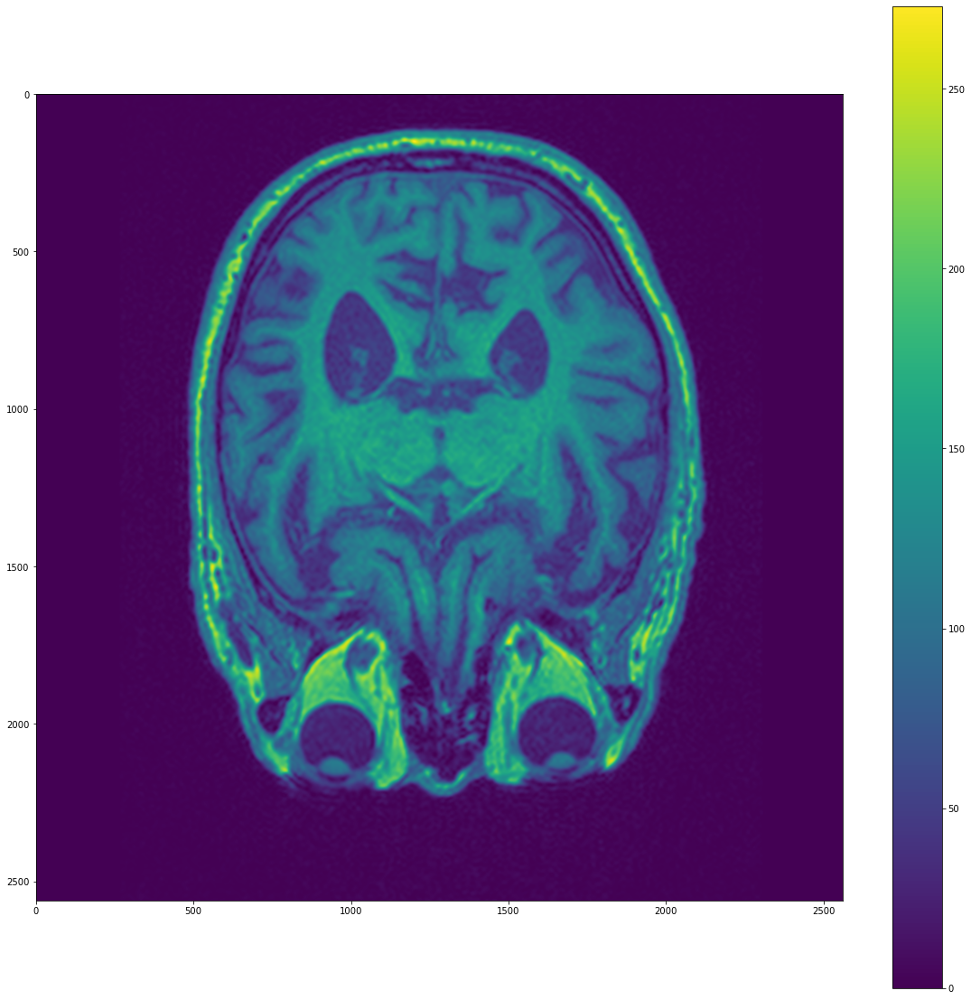

In [16]:
# low_path = './image/image_origin/low/0685.npy'
# low_path = './image/image_double_polar_64/abs/low/0600.npy'
# low_path = './image/image_double_cart_64/real/low/0685.npy'
low_path = './T2_data/new_image24.npy'
low = np.abs(np.load(low_path))
# plt.imsave('./new_real_24.jpg',low)

plt.figure(figsize=(20,20))
plt.imshow(low)
plt.colorbar()
patch_set = patchify(low,64,64,16,16,goback=0)
shape = patch_set.shape
print(patch_set.shape)

In [ ]:
X = shape[0]
Y = shape[1]  
new_patch_set=np.zeros(shape)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
net = UNet(n_channels=1, n_classes=1, bilinear=False)
net.load_state_dict(torch.load('MODEL_ori_abs.pth', map_location=device),strict=True)

# i=0
# pat_line = np.zeros((157,1,64,64),dtype=float)
# with tqdm(total=Y, desc=f'Loop {i+1}/{X}', unit='patches',mininterval=0.1,maxinterval=100.0) as pbar:
#     for i in range(X):
#         pat_line[:,0,:,:] = patch_set[:,i,:,:]
#         pat_tensor = torch.as_tensor(pat_line.copy()).float().contiguous()
        
#         with torch.no_grad():
#             masks_pred = net(pat_tensor)
#             pred_pat = masks_pred.detach().numpy()
#         new_patch_set[:,i,:,:] = pred_pat[:,0,:,:]
#         pbar.update(1)
# print('Set is created ✧≖ ◡ ≖✿')

for i in range(X):
    with tqdm(total=X, desc=f'Loop {i+1}/{X}', unit='patches',mininterval=0.1,maxinterval=10.0) as pbar:
        for j in range(Y):
            pat = patch_set[i,j,:,:]
            PAT = pat[np.newaxis,np.newaxis,...]/255.0
            pat_tensor = torch.as_tensor(PAT.copy()).float().contiguous()
            with torch.no_grad():
                masks_pred = net(pat_tensor)
                pred_pat = masks_pred.detach().numpy()[0, 0, :, :]
            new_patch_set[i,j,:,:] = pred_pat
            pbar.update(1)
print('Set is created ✧≖ ◡ ≖✿')
np.save('./set/set_new_16.npy',new_patch_set)

Loop 131/157:  41%|████      | 64/157 [00:36<00:52,  1.77patches/s]

In [4]:
new_patch_set = np.load('./set/set_new_16.npy')
print(new_patch_set.shape)

(157, 157, 64, 64)


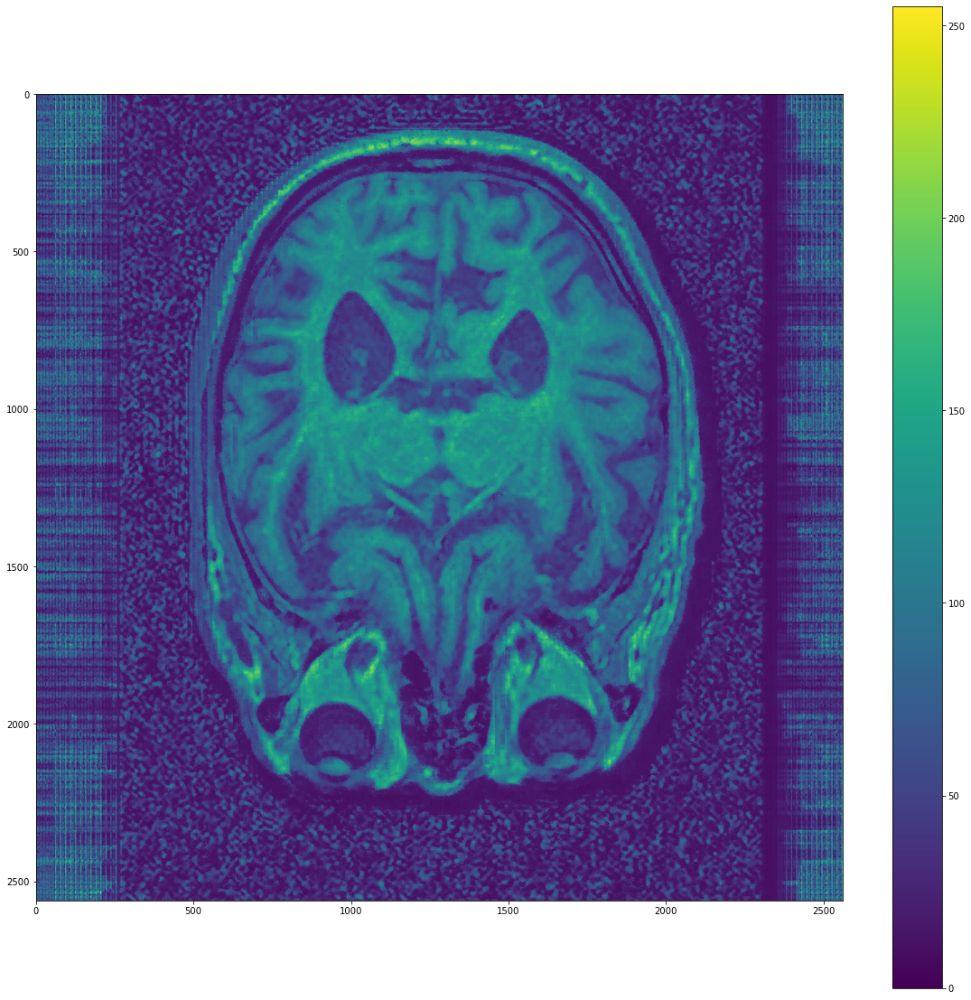

In [6]:
# low_path = './T2_data/new_image.npy'
# low = abs(np.load(low_path))
# plt.imsave('./T2_data/new_edge_real.jpg',low)
# print(low.shape)
# plt.figure(figsize=(20,20))
# plt.imshow(low,'jet',vmax=255)
# plt.colorbar()
# pred = unpatchify_hand(new_patch_set, 64, 64, 16, 16, 'a', goback=0)
# # pred = unpatchify(new_patch_set,64,64,16,16,goback=0)
# # print(pred.shape)
# plt.figure(figsize=(20,20))
# plt.imshow(pred,vmax=255)
# plt.colorbar()
# # plt.imsave('./res/data2_edge_real_07060555.jpg',pred,vmax=250)
# # np.save('./res/data2_edge_real_07060555.npy',pred)

pred = unpatchify_hand(new_patch_set, 64, 64, 16, 16, 'f', goback=0)
plt.figure(figsize=(20,20))
plt.imshow(pred,vmax=255)
plt.colorbar()
plt.imsave('./02a.jpg',pred,vmax=255)

# np.save('./res/data2_edge_real_07060555.npy',pred)
# # plt.imsave('./T2_data/123.jpg',pred)
# # plt.imsave('./T2_data/new_image_real.jpg',pred,vmax=130)
# np.save('./T2_data/new_image_real.npy',pred2)
# pred = (pred+255)/2
# print(np.max(pred))
# plt.figure(figsize=(20,20))
# plt.imshow(pred,'jet',vmax=255)
# plt.colorbar()

# plt.imsave('./res/data1_ori_07050840.jpg',pred,vmax=250)
# np.save('./res/data1_ori_07050840.npy',pred)

131.51947929340835


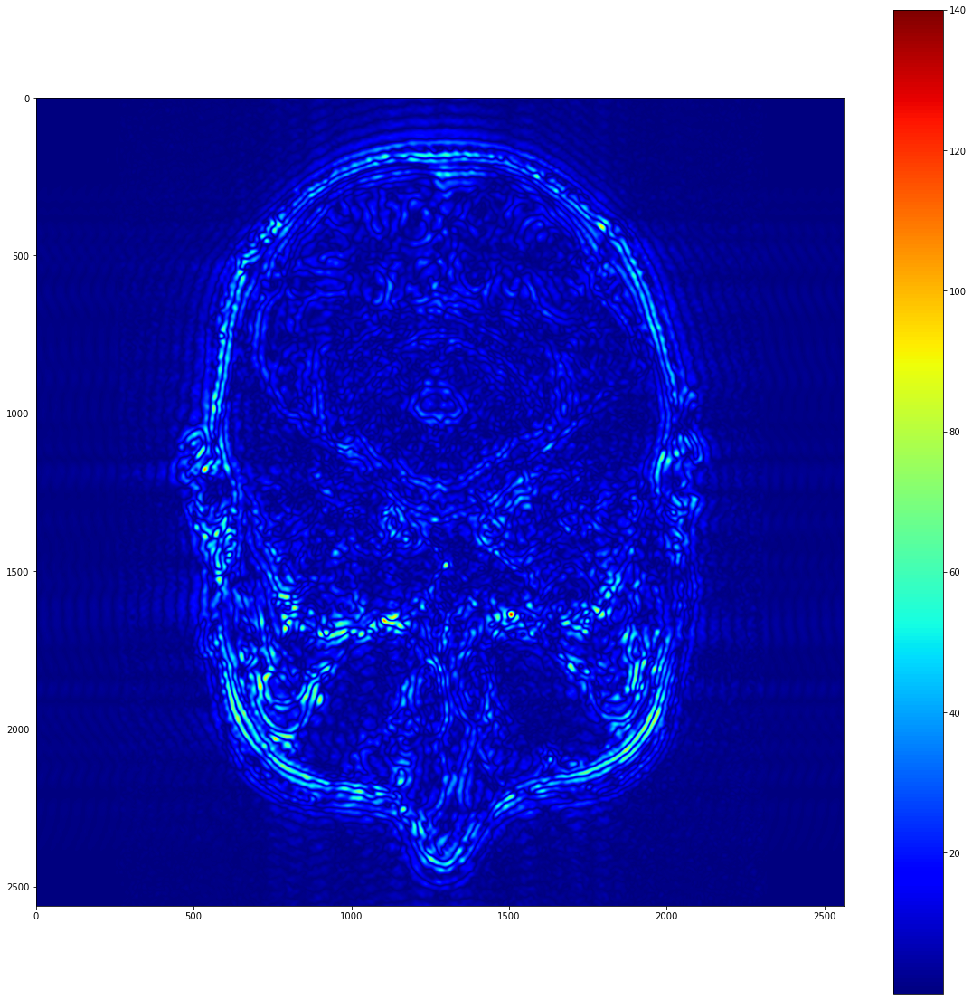

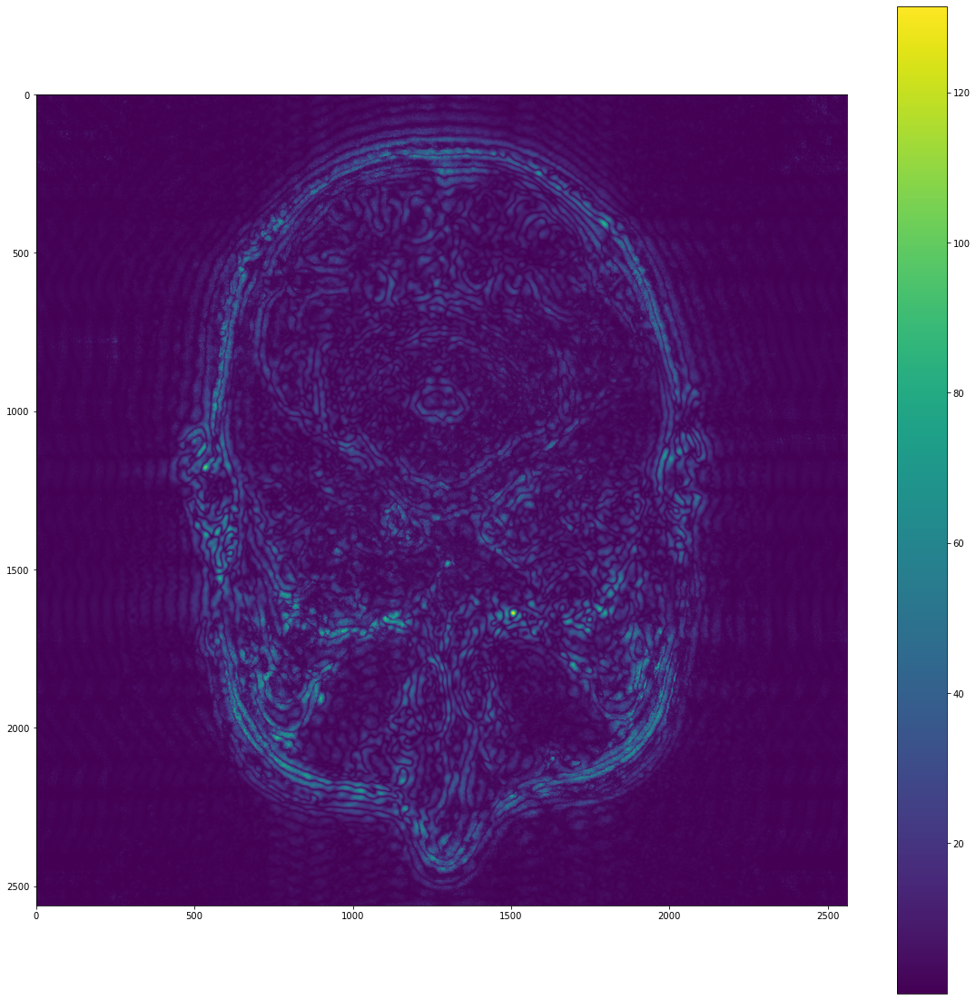

In [16]:
real = pred

low_path = './T2_data/new_edge.npy'
low = np.abs(np.load(low_path))
plt.figure(figsize=(20,20))
plt.imshow(low,'jet',vmax = 140)
plt.colorbar()

# low_path = './image/image_double_cart_64/real/low/0685.npy'
imag = np.imag(np.load(low_path))

edge = real+1j*imag
plt.figure(figsize=(20,20))
plt.imshow(np.abs(edge))
plt.colorbar()
print(np.max(abs(edge)))
# plt.imsave('./ed.jpg',abs(edge))

# plt.imsave('./res/data2_edge_real_withimag_nocore_07050230.jpg',abs(edge),vmax=140,cmap='jet')
# np.save('./res/data2_edge_real_withimag_nocore_07050230.npy',edge)
# plt.imsave('./res/data2_edge.jpg',low,vmax=140,cmap='jet')
# np.save('./res/data2_edge.npy',low)

In [13]:
# fft_edge = fft.fftshift(fft.fft2(edge))
# plt.figure(figsize=(20,20))
# plt.imshow(np.abs(fft_edge),'jet')
# plt.colorbar()

(256, 256)


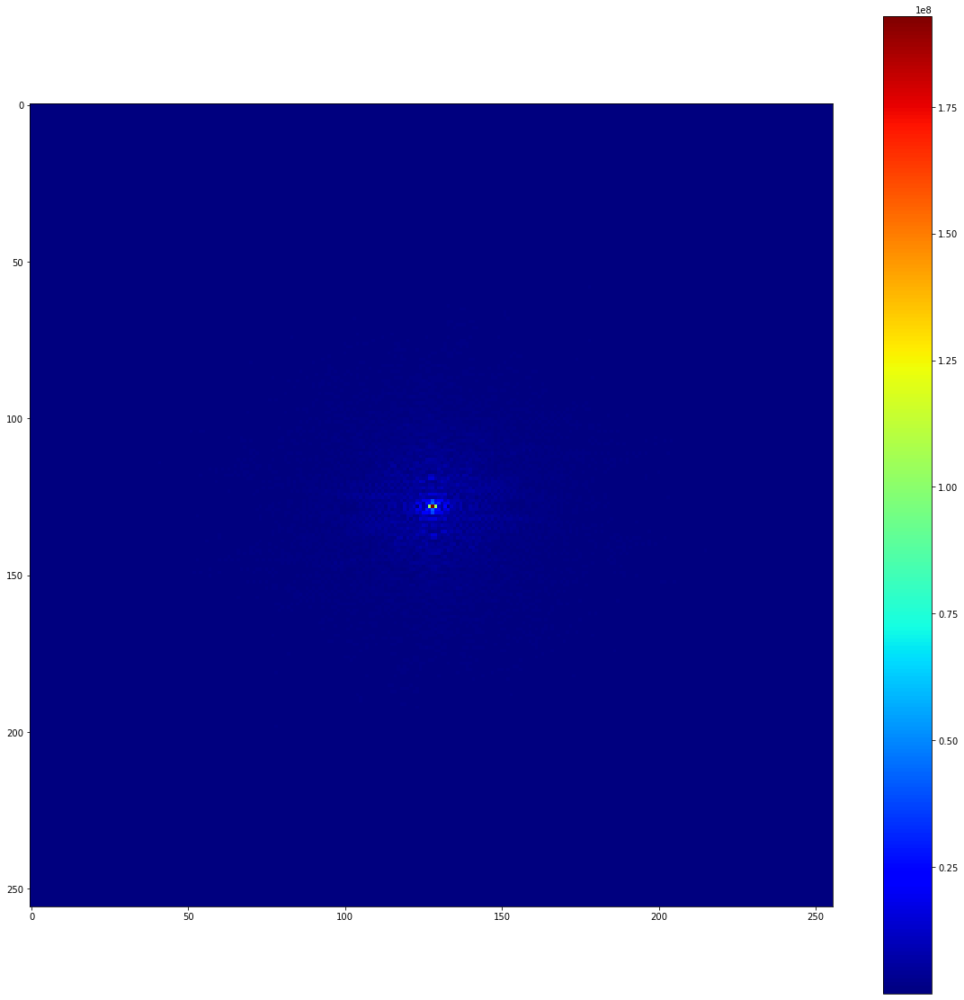

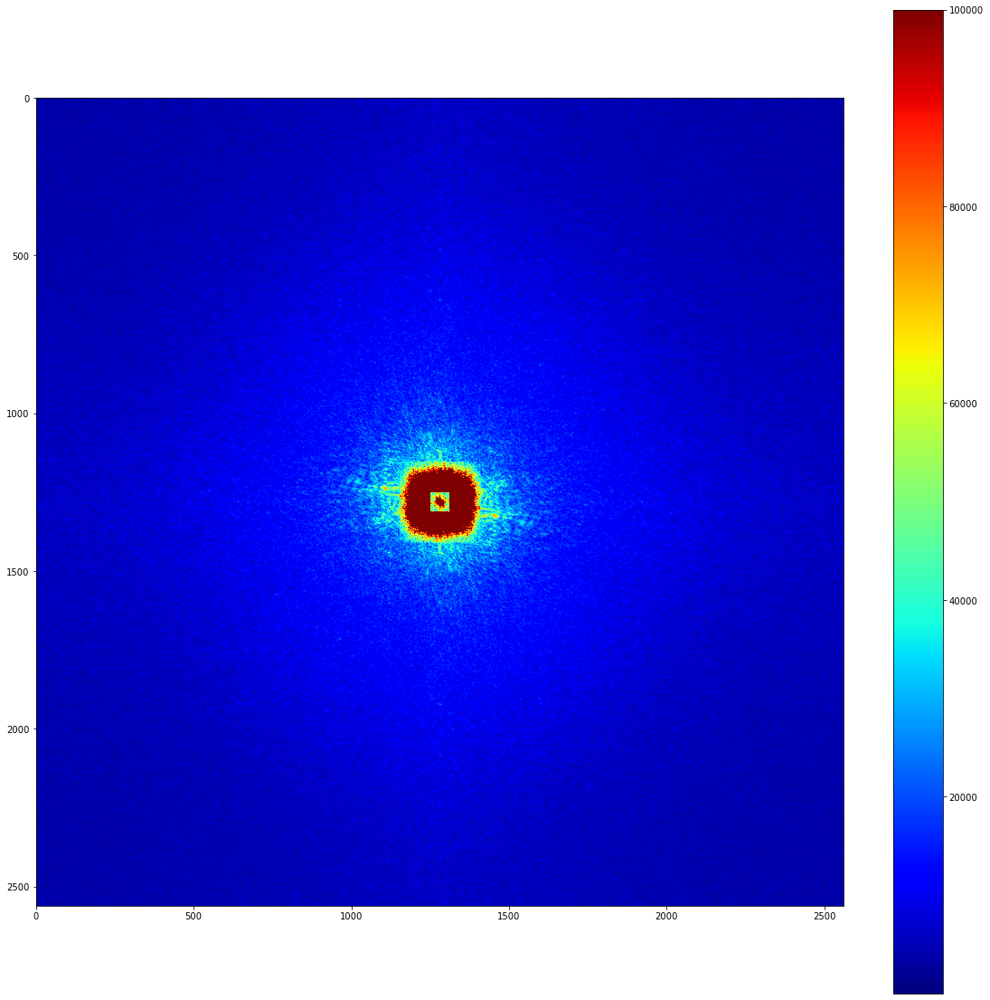

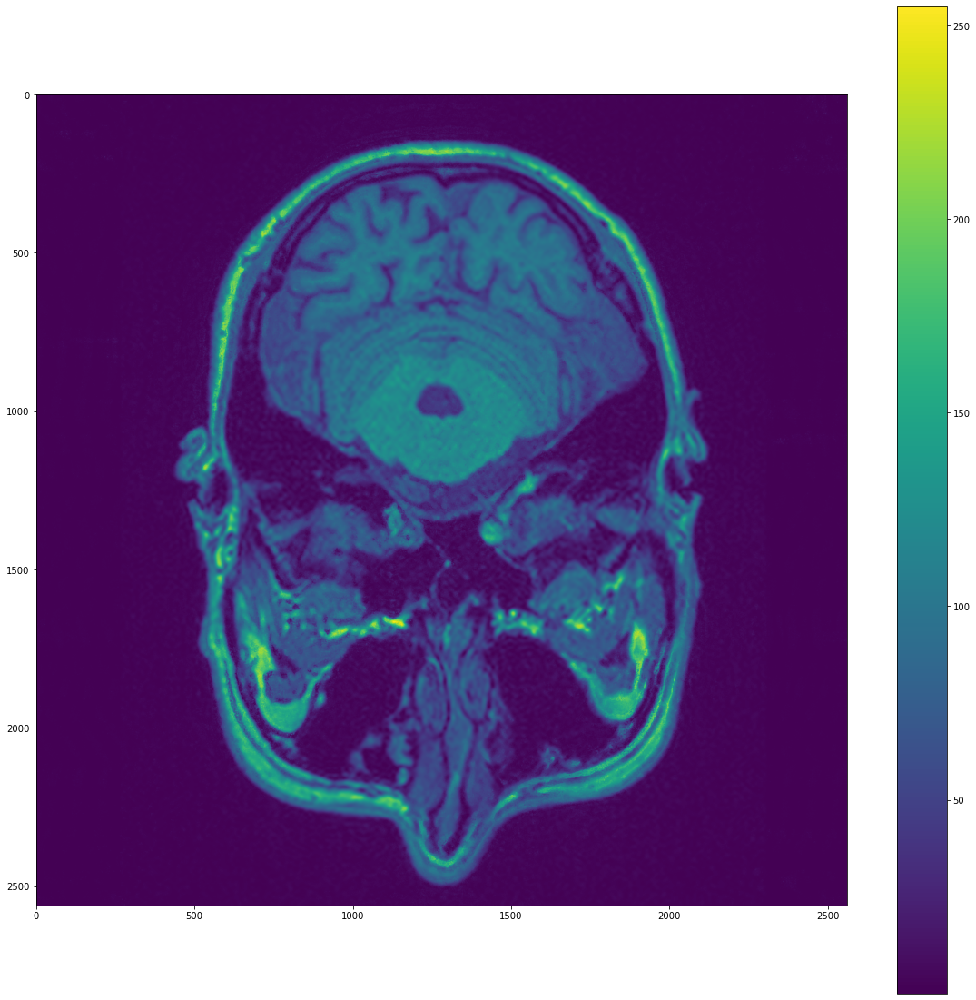

In [22]:
center = np.load('./T2_data/center.npy')
print(center.shape)
plt.figure(figsize=(20,20))
plt.imshow(np.abs(center),'jet')
plt.colorbar()
fft_edge = fft.fftshift(fft.fft2(edge))
plt.figure(figsize=(20,20))
plt.imshow(np.abs(fft_edge),'jet',vmax = 10**5)
plt.colorbar()
plt.imsave('./cc.jpg',np.abs(fft_edge),cmap='jet')
fft_edge[1281-128:1281+128,1281-128:1281+128] = center
# fft_edge[1281-32:1281+32,1281-32:1281+32] = center[129-32:129+32,129-32:129+32]
img = fft.ifft2(fft_edge)
plt.figure(figsize=(20,20))
plt.imshow(np.abs(img),vmax=255)
plt.colorbar()

# print(np.max(abs(img)))
# plt.imsave('./data.jpg',abs(img),vmax=255)
# # np.save('./res/data2_edge_real_withimag_withcore_07050248.npy',img)
# center = np.load('./data/data_center/0685.npy')
# print(center.shape)
# plt.figure(figsize=(20,20))
# plt.imshow(np.abs(center),'jet')
# plt.colorbar()
# fft_edge = fft.fftshift(fft.fft2(edge))
# plt.figure(figsize=(20,20))
# plt.imshow(np.abs(fft_edge),'jet',vmax=10**5)
# plt.colorbar()
# # plt.imsave('./cc.jpg',np.abs(fft_edge),cmap='jet',vmax=10**5)
# fft_edge[881-88:881+88,881-88:881+88] = center
# # fft_edge[1281-32:1281+32,1281-32:1281+32] = center[129-32:129+32,129-32:129+32]
# img = fft.ifft2(fft_edge)
# plt.figure(figsize=(20,20))
# plt.imshow(np.abs(img),vmax=255)
# plt.colorbar()

# # print(np.max(abs(img)))
# plt.imsave('./data2.jpg',abs(img),vmax=255)
# np.save('./res/data2_edge_real_withimag_withcore_07050248.npy',img)

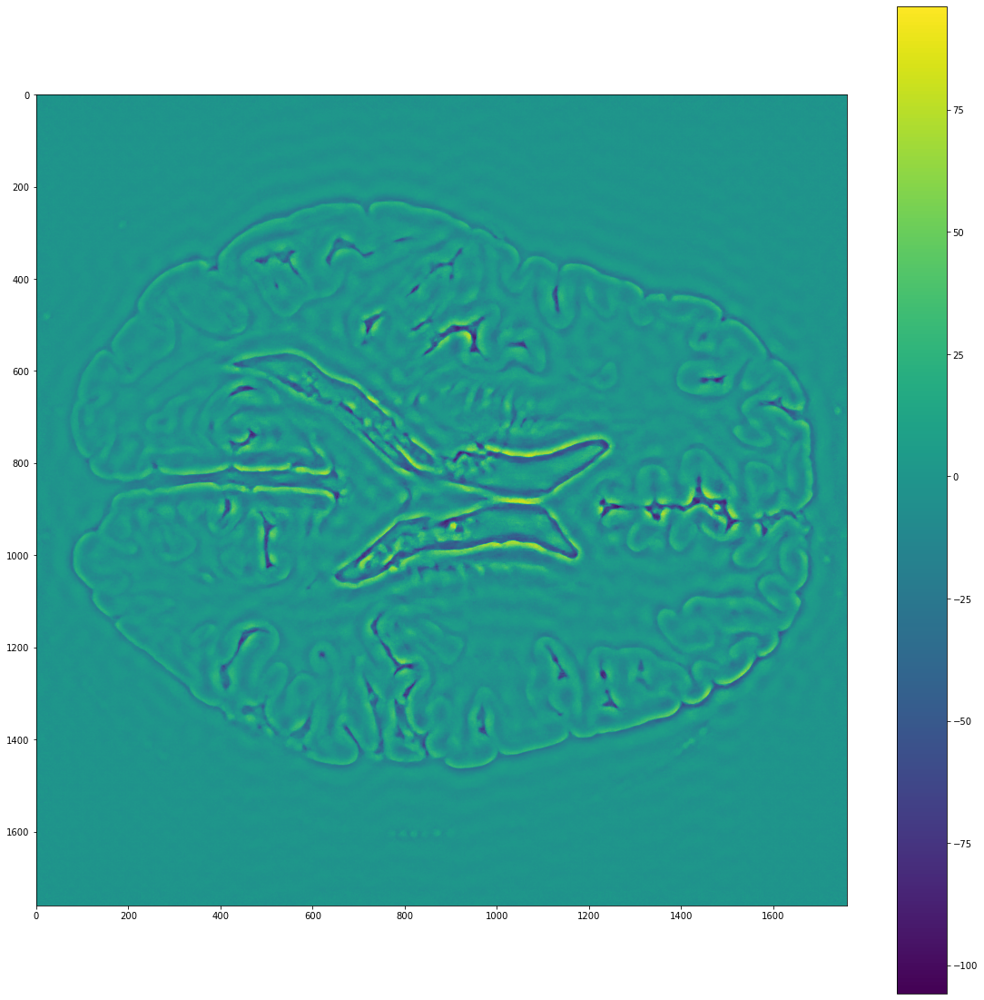

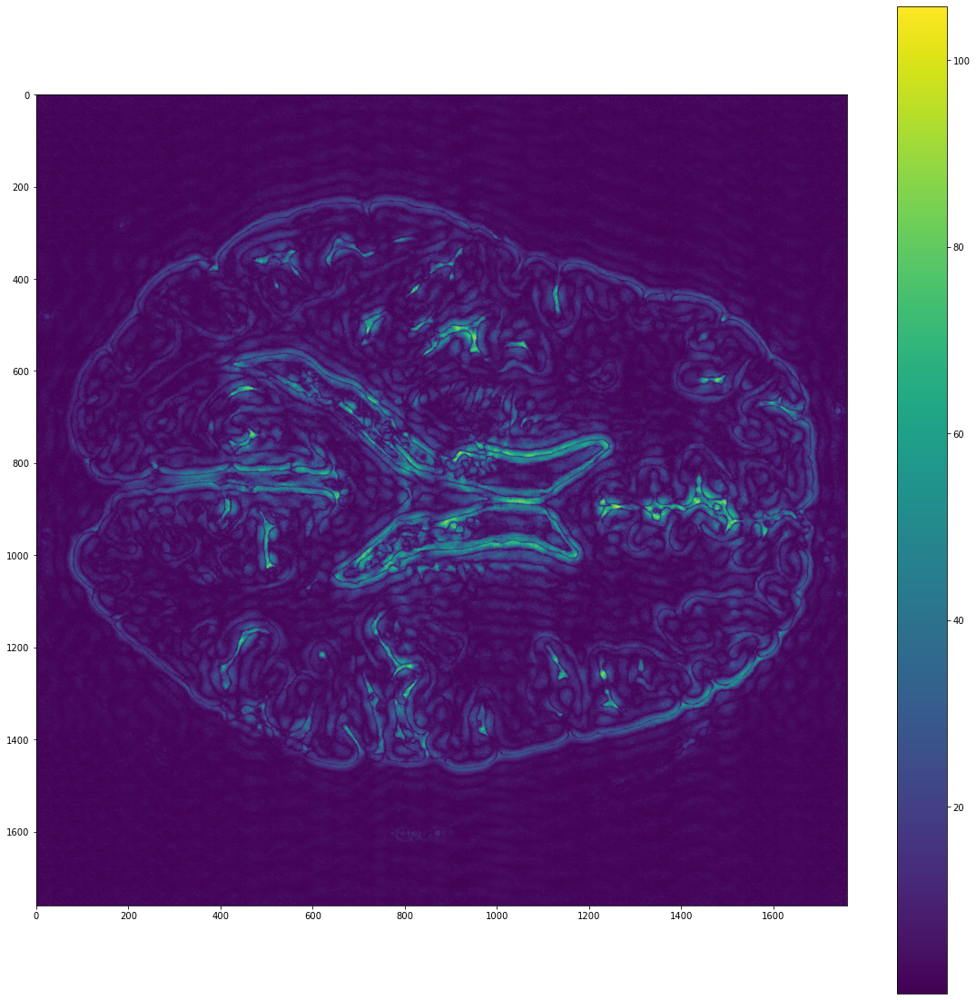

In [26]:
# pred = pred*2-255
plt.figure(figsize=(20,20))
plt.imshow(pred)
plt.colorbar()
plt.imsave('./T2_data/new_image_real.jpg',pred)
imag_path = './image/image_double_cart_64/imag/high/0685.npy'
imag = np.load(imag_path)
img = pred+1j*imag
plt.figure(figsize=(20,20))
plt.imshow(abs(img))
plt.colorbar()
plt.imsave('./highdenbu.jpg',abs(img))

In [38]:
low_path = './image/image_origin/low/0685.npy'
low = np.load(low_path)
high_path = './image/image_origin/high/0685.npy'
high = np.load(high_path)
print(psnr(pred,high))

29.24768421383249


In [17]:
from scipy.io import loadmat
edge = loadmat('edge.mat')['xzp_new']

In [20]:
np.save('data_edge.npy',edge)

In [23]:
p = np.load('data_edge.npy')
print(p.shape)

(2560, 2560)


(2560, 2560)


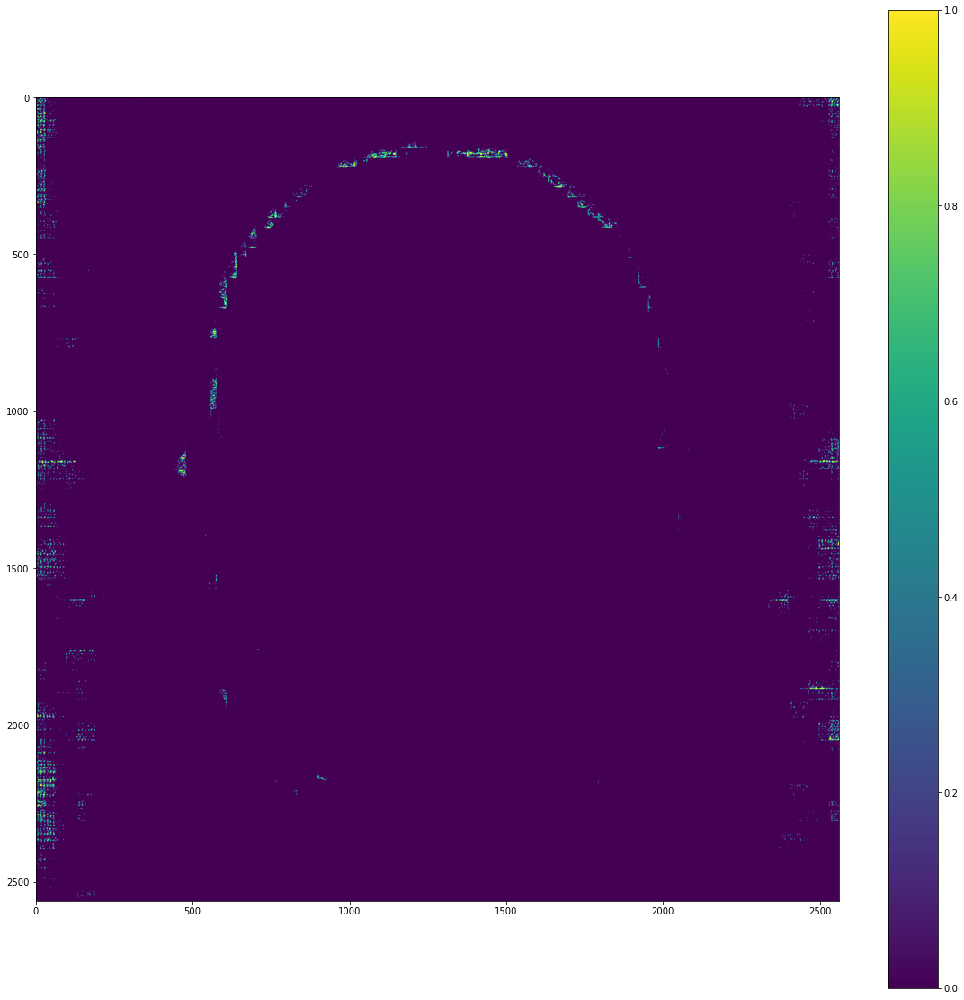

In [22]:
print(judger.shape)
plt.figure(figsize=(20,20))
plt.imshow(judger)
plt.colorbar()

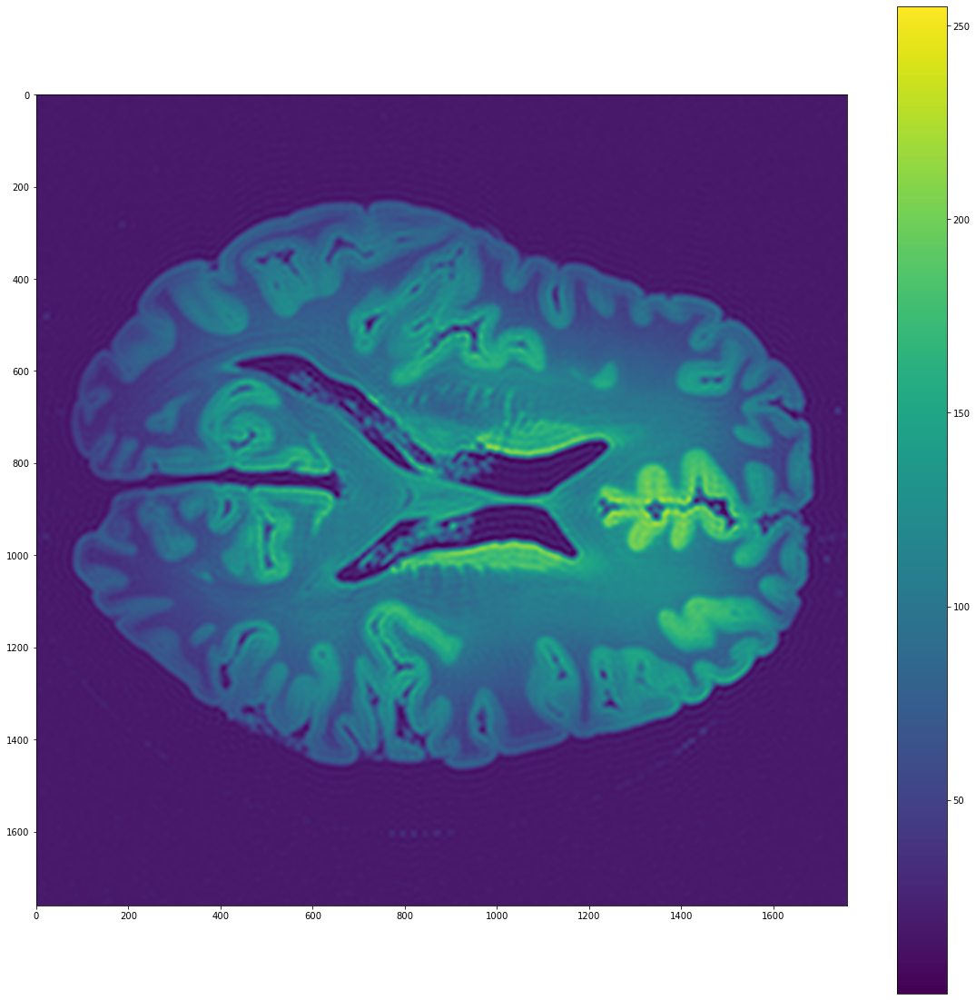

In [24]:
low = np.load('./image/image_origin/low/0685.npy')
plt.figure(figsize=(20,20))
plt.imshow(low,vmax=255)
plt.colorbar()
plt.imsave('./res/original_low_image_0685.jpg',low,vmax=255)

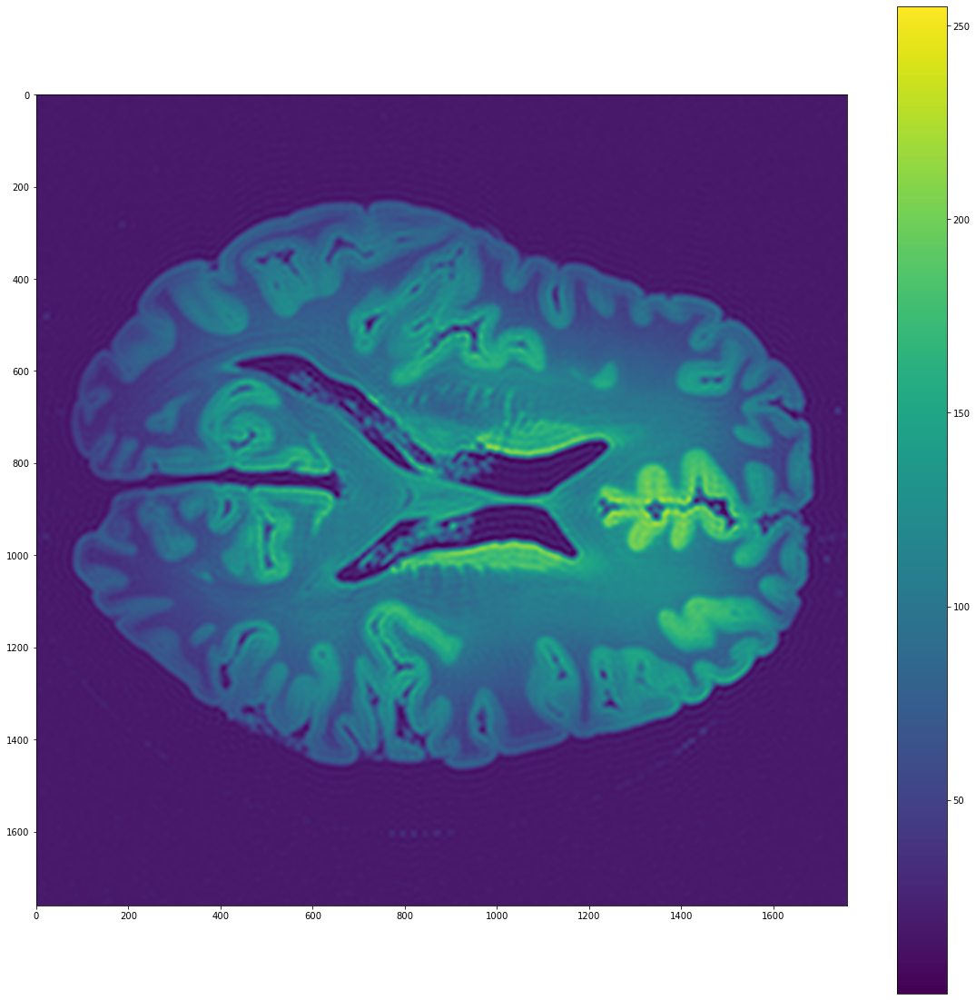

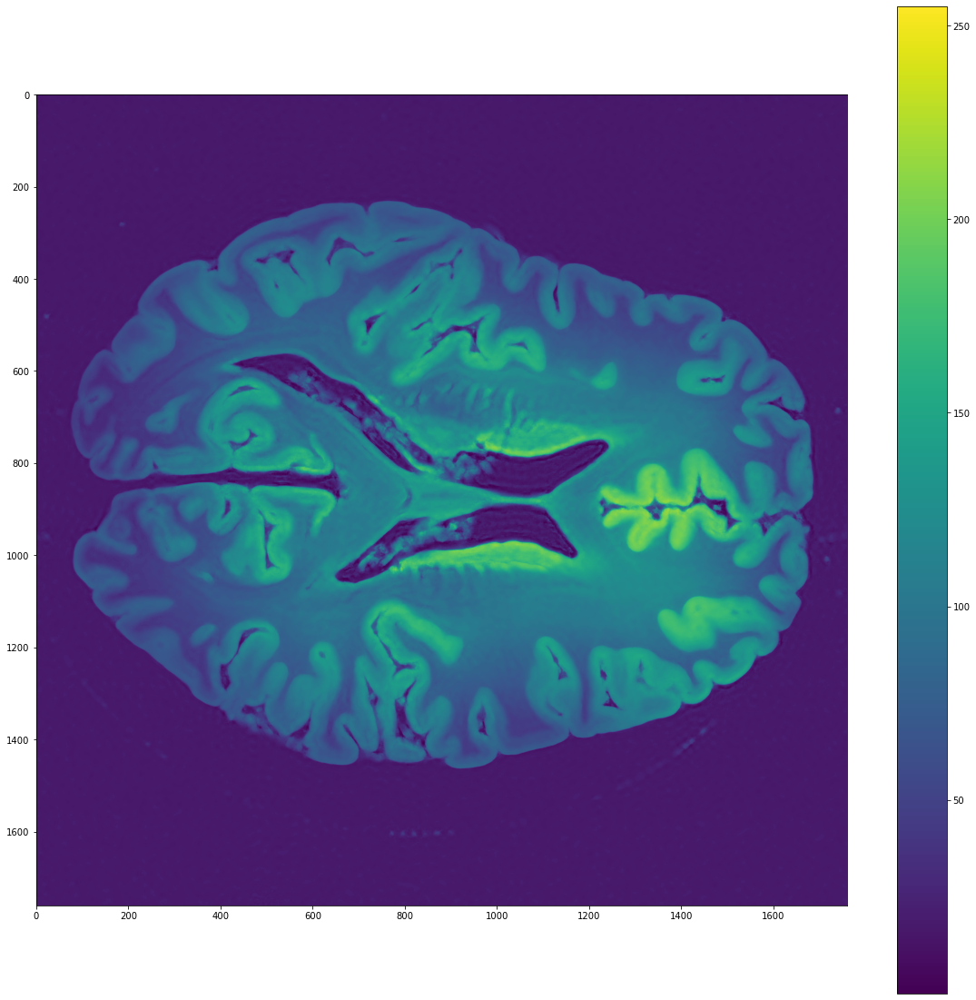

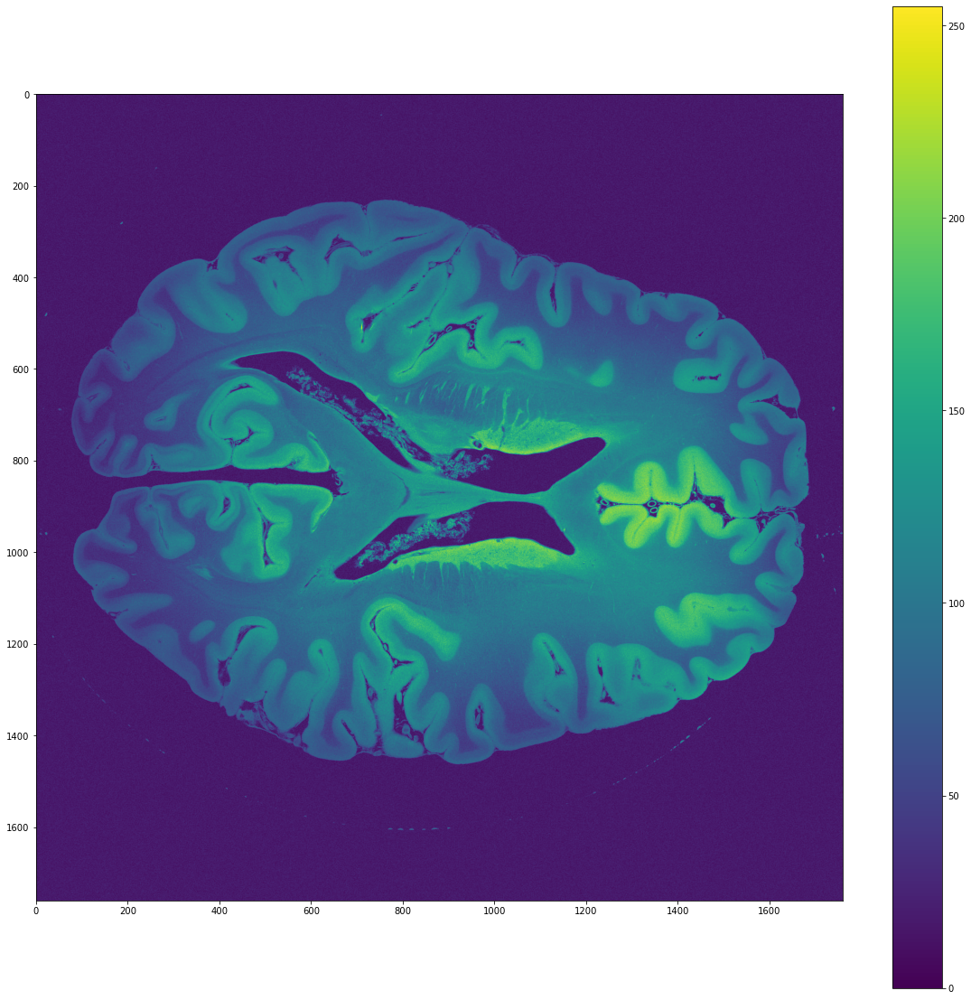

In [26]:
low = np.load('./image/image_origin/low/0685.npy')
plt.figure(figsize=(20,20))
plt.imshow(low,vmax=255)
plt.colorbar()

plt.figure(figsize=(20,20))
plt.imshow(np.abs(img),vmax=255)
plt.colorbar()

high = np.load('./image/image_origin/high/0685.npy')
plt.figure(figsize=(20,20))
plt.imshow(high,vmax=255)
plt.colorbar()

In [27]:
print(psnr(low,high))

28.903574131637928


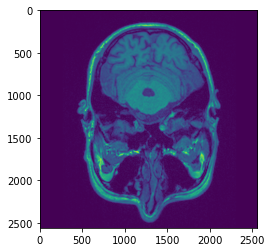

In [17]:
img = np.load('./T2_data/new_image.npy')
plt.imshow(abs(img),vmax=255.0)
plt.imsave('./T2_data/new_image.jpg',abs(img),vmax=255.0)

255.0


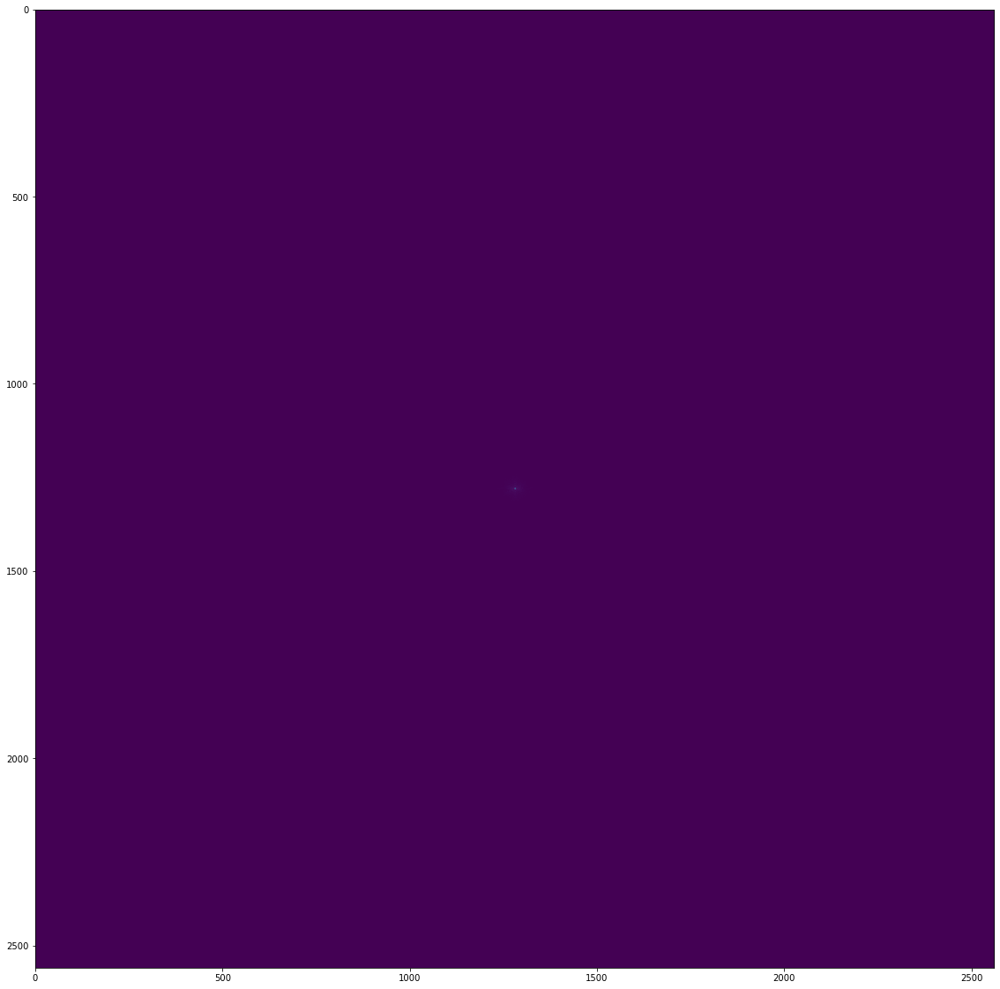